# Micro Credit Defaulter Project.


# Problem Statement. 

We have a dataset from a Telecom company who collaborated with Microfinance Institution (MFI). Microfinance Institution (MFI) is an organization that offers financial services to low income populations. The company provide micro-credit on mobile balances to be paid back in 5 days. The Consumer is believed to be defaulter if he deviates from the path of paying back the loaned amount within the time duration of 5 days.

We need to predict whether the customer will be paying back the loaned amount within 5 days of insurance of loan. In our case, Label 1 indicates that the loan has been payed i.e. Non- defaulter, while, Label 0 indicates that the loan has not been payed i.e. defaulter.  

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [2]:
pd.set_option('display.max_columns',None)

In [3]:
loan = pd.read_csv('Data file.csv')
loan.head()

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22


Here we get our dataset. We can see that out Target variable that is label is in categorical format(0,1). So we need build a classififcation model. 

In [4]:
print("Our dataset shape is:",loan.shape)
print("We have",loan.shape[0],"rows in our datset")
print("We have",loan.shape[1],"Columns in our datset")

Our dataset shape is: (209593, 37)
We have 209593 rows in our datset
We have 37 Columns in our datset


In [5]:
print("Null values in the dataset:\n",loan.isnull().sum())
print("Total Null values in our dataset",loan.isnull().sum().sum())

Null values in the dataset:
 Unnamed: 0              0
label                   0
msisdn                  0
aon                     0
daily_decr30            0
daily_decr90            0
rental30                0
rental90                0
last_rech_date_ma       0
last_rech_date_da       0
last_rech_amt_ma        0
cnt_ma_rech30           0
fr_ma_rech30            0
sumamnt_ma_rech30       0
medianamnt_ma_rech30    0
medianmarechprebal30    0
cnt_ma_rech90           0
fr_ma_rech90            0
sumamnt_ma_rech90       0
medianamnt_ma_rech90    0
medianmarechprebal90    0
cnt_da_rech30           0
fr_da_rech30            0
cnt_da_rech90           0
fr_da_rech90            0
cnt_loans30             0
amnt_loans30            0
maxamnt_loans30         0
medianamnt_loans30      0
cnt_loans90             0
amnt_loans90            0
maxamnt_loans90         0
medianamnt_loans90      0
payback30               0
payback90               0
pcircle                 0
pdate                   0
dtype: in

In [6]:
print("Datatypes of columns in our dataset:\n")
print(loan.dtypes)

Datatypes of columns in our dataset:

Unnamed: 0                int64
label                     int64
msisdn                   object
aon                     float64
daily_decr30            float64
daily_decr90            float64
rental30                float64
rental90                float64
last_rech_date_ma       float64
last_rech_date_da       float64
last_rech_amt_ma          int64
cnt_ma_rech30             int64
fr_ma_rech30            float64
sumamnt_ma_rech30       float64
medianamnt_ma_rech30    float64
medianmarechprebal30    float64
cnt_ma_rech90             int64
fr_ma_rech90              int64
sumamnt_ma_rech90         int64
medianamnt_ma_rech90    float64
medianmarechprebal90    float64
cnt_da_rech30           float64
fr_da_rech30            float64
cnt_da_rech90             int64
fr_da_rech90              int64
cnt_loans30               int64
amnt_loans30              int64
maxamnt_loans30         float64
medianamnt_loans30      float64
cnt_loans90             float64
am

We have all the values in our dataset in int64 or float64 format. Except we have pcircle and pdate which are in object. We have to treat this date column as this information could be helpful in predicting the label. 

In [7]:
loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 37 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            209593 non-null  int64  
 1   label                 209593 non-null  int64  
 2   msisdn                209593 non-null  object 
 3   aon                   209593 non-null  float64
 4   daily_decr30          209593 non-null  float64
 5   daily_decr90          209593 non-null  float64
 6   rental30              209593 non-null  float64
 7   rental90              209593 non-null  float64
 8   last_rech_date_ma     209593 non-null  float64
 9   last_rech_date_da     209593 non-null  float64
 10  last_rech_amt_ma      209593 non-null  int64  
 11  cnt_ma_rech30         209593 non-null  int64  
 12  fr_ma_rech30          209593 non-null  float64
 13  sumamnt_ma_rech30     209593 non-null  float64
 14  medianamnt_ma_rech30  209593 non-null  float64
 15  

In [8]:
loan.describe(include='all')

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
count,209593.000000,209593.000000,209593,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593,209593
unique,NaN,NaN,186243,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,82
top,NaN,NaN,47819I90840,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,UPW,2016-07-04
freq,NaN,NaN,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,209593,3150
mean,104797.000000,0.875177,NaN,8112.343445,5381.402289,6082.515068,2692.581910,3483.406534,3755.847800,3712.202921,2064.452797,3.978057,3737.355121,7704.501157,1812.817952,3851.927942,6.31543,7.716780,12396.218352,1864.595821,92.025541,262.578110,3749.494447,0.041495,0.045712,2.758981,17.952021,274.658747,0.054029,18.520919,23.645398,6.703134,0.046077,3.398826,4.321485,NaN,NaN
std,60504.431823,0.330519,NaN,75696.082531,9220.623400,10918.812767,4308.586781,5770.461279,53905.892230,53374.833430,2370.786034,4.256090,53643.625172,10139.621714,2070.864620,54006.374433,7.19347,12.590251,16857.793882,2081.680664,369.215658,4183.897978,53885.414979,0.397556,0.951386,2.554502,17.379741,4245.264648,0.218039,224.797423,26.469861,2.103864,0.200692,8.813729,10.308108,NaN,NaN
min,1.000000,0.000000,NaN,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.000000,-29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-200.000000,0.00000,0.000000,0.000000,0.000000,-200.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN
25%,52399.000000,1.000000,NaN,246.000000,42.440000,42.692000,280.420000,300.260000,1.000000,0.000000,770.000000,1.000000,0.000000,1540.000000,770.000000,11.000000,2.00000,0.000000,2317.000000,773.000000,14.600000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,6.000000,0.000000,1.000000,6.000000,6.000000,0.000000,0.000000,0.000000,NaN,NaN
50%,104797.000000,1.000000,NaN,527.000000,1469.175667,1500.000000,1083.570000,1334.000000,3.000000,0.000000,1539.000000,3.000000,2.000000,4628.000000,1539.000000,33.900000,4.00000,2.000000,7226.000000,1539.000000,36.000000,0.000000,0.000000,0.000000,0.000000,2.000000,12.000000,6.000000,0.000000,2.000000,12.000000,6.000000,0.000000,0.000000,1.666667,NaN,NaN
75%,157195.000000,1.000000,NaN,982.000000,7244.000000,7802.790000,3356.940000,4201.790000,7.000000,0.000000,2309.000000,5.000000,6.000000,10010.000000,1924.000000,83.000000,8.00000,8.000000,16000.000000,1924.000000,79.310000,0.000000,0.000000,0.000000,0.000000,4.000000,24.000000,6.000000,0.000000,5.000000,30.000000,6.000000,0.000000,3.750000,4.500000,NaN,NaN


<AxesSubplot:xlabel='label', ylabel='count'>

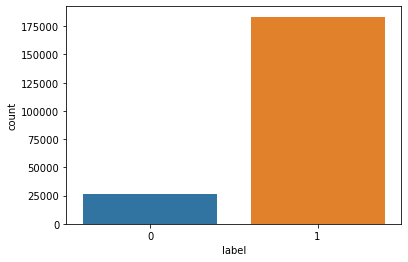

In [9]:
sns.countplot(loan["label"])

The above countplot shows the value of the target column. We can see that we have approx 25000 non payers, defaulters and approx 175000 payers non defaulters. We can see a huge variance in the values, hence we conclude that our dataset is imbalanced. 

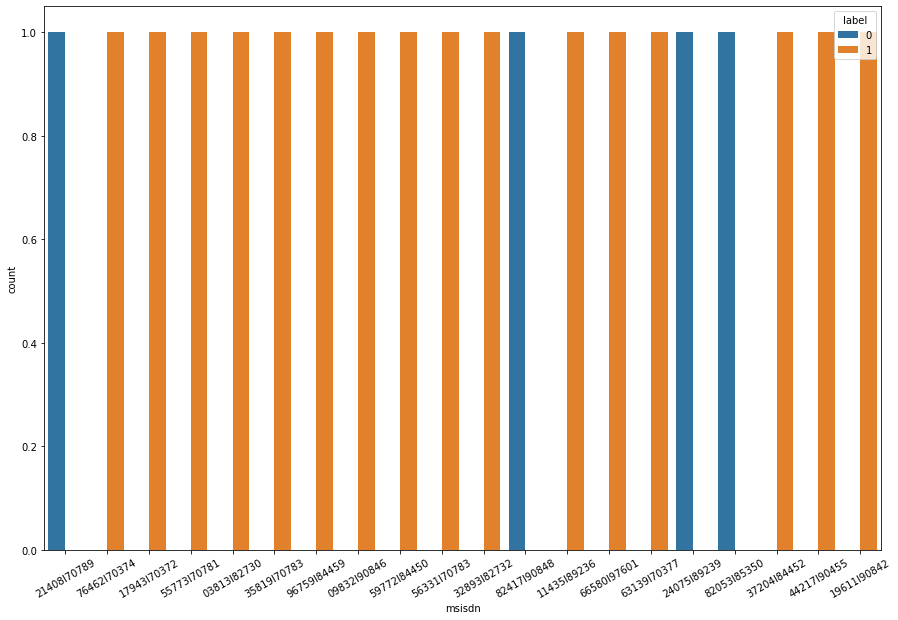

In [10]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=30)
sns.countplot(loan["msisdn"].head(20), data = loan, hue="label")
plt.show()

In [11]:
loan.dtypes

Unnamed: 0                int64
label                     int64
msisdn                   object
aon                     float64
daily_decr30            float64
daily_decr90            float64
rental30                float64
rental90                float64
last_rech_date_ma       float64
last_rech_date_da       float64
last_rech_amt_ma          int64
cnt_ma_rech30             int64
fr_ma_rech30            float64
sumamnt_ma_rech30       float64
medianamnt_ma_rech30    float64
medianmarechprebal30    float64
cnt_ma_rech90             int64
fr_ma_rech90              int64
sumamnt_ma_rech90         int64
medianamnt_ma_rech90    float64
medianmarechprebal90    float64
cnt_da_rech30           float64
fr_da_rech30            float64
cnt_da_rech90             int64
fr_da_rech90              int64
cnt_loans30               int64
amnt_loans30              int64
maxamnt_loans30         float64
medianamnt_loans30      float64
cnt_loans90             float64
amnt_loans90              int64
maxamnt_

In [12]:
loan_new = loan.copy()
loan_new.head()

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22


In [13]:
loan_new = loan_new.drop('Unnamed: 0',axis =1)
loan_new = loan_new.drop('pcircle',axis =1)
loan_new = loan_new.drop('msisdn',axis=1)

In [14]:
loan_new.head()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pdate
0,0,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,2016-07-20
1,1,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,2016-08-10
2,1,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,2016-08-19
3,1,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,2016-06-06
4,1,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,2016-06-22


We have dropped Unnamed:0, pcircle and msisdn columns. 

In [15]:
print("Old shape is",loan.shape)
print("New shape is",loan_new.shape)

Old shape is (209593, 37)
New shape is (209593, 34)


In [16]:
loan["pdate"].dtypes

dtype('O')

In [17]:
loan_new['Day'] = pd.to_datetime(loan_new['pdate'], format="%Y-%m-%d").dt.day
loan_new['Month'] = pd.to_datetime(loan_new['pdate'], format="%Y-%m-%d").dt.month
loan_new['Year'] = pd.to_datetime(loan_new['pdate'], format="%Y-%m-%d").dt.year

In [18]:
loan_new = loan_new.drop('pdate',axis =1)

In [19]:
print("New shape is",loan_new.shape)

New shape is (209593, 36)


In [20]:
loan_new["Day"].dtypes

dtype('int64')

label                      AxesSubplot(0.125,0.749828;0.0824468x0.130172)
aon                     AxesSubplot(0.223936,0.749828;0.0824468x0.130172)
daily_decr30            AxesSubplot(0.322872,0.749828;0.0824468x0.130172)
daily_decr90            AxesSubplot(0.421809,0.749828;0.0824468x0.130172)
rental30                AxesSubplot(0.520745,0.749828;0.0824468x0.130172)
rental90                AxesSubplot(0.619681,0.749828;0.0824468x0.130172)
last_rech_date_ma       AxesSubplot(0.718617,0.749828;0.0824468x0.130172)
last_rech_date_da       AxesSubplot(0.817553,0.749828;0.0824468x0.130172)
last_rech_amt_ma           AxesSubplot(0.125,0.593621;0.0824468x0.130172)
cnt_ma_rech30           AxesSubplot(0.223936,0.593621;0.0824468x0.130172)
fr_ma_rech30            AxesSubplot(0.322872,0.593621;0.0824468x0.130172)
sumamnt_ma_rech30       AxesSubplot(0.421809,0.593621;0.0824468x0.130172)
medianamnt_ma_rech30    AxesSubplot(0.520745,0.593621;0.0824468x0.130172)
medianmarechprebal30    AxesSubplot(0.

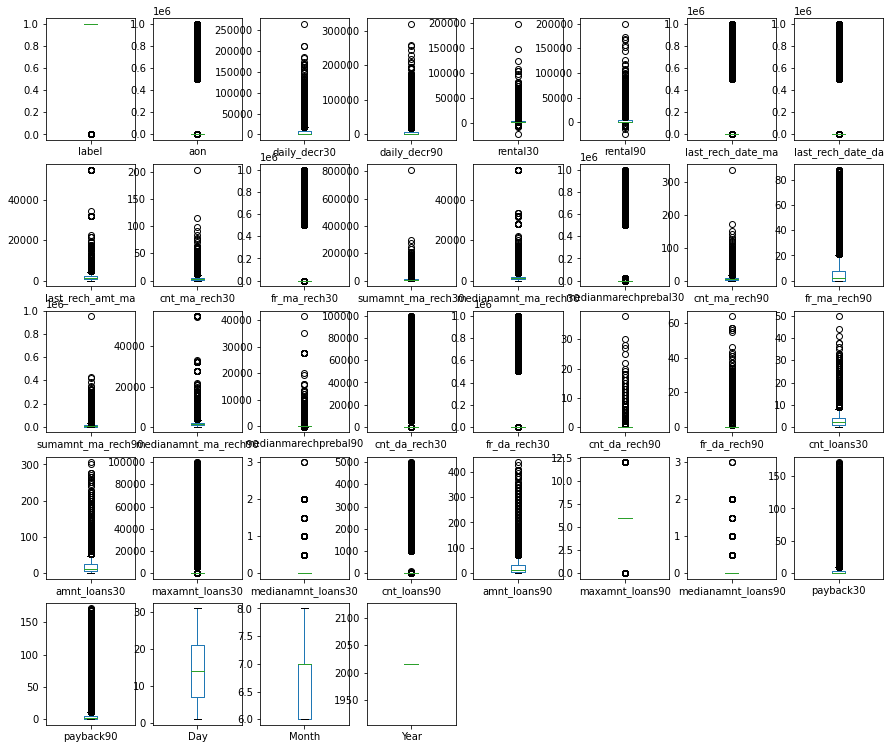

In [21]:
loan_new.plot(kind='box', subplots=True, layout=(5,8), figsize = (15,13))

In [22]:
from scipy.stats import zscore
loan_zscore = np.abs(zscore(loan_new))

In [23]:
loan_clean = loan_new[(loan_zscore < 3).all(axis=1)]
print("New shape",loan_clean.shape)
print('origional Shape',loan_new.shape)

New shape (0, 36)
origional Shape (209593, 36)


In [24]:
data_loss = (209593-0)/209593*100
data_loss

100.0

In [25]:
loan_new.head()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,Day,Month,Year
0,0,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,20,7,2016
1,1,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,10,8,2016
2,1,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,19,8,2016
3,1,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,6,6,2016
4,1,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,22,6,2016


In [26]:
col = loan_new.columns
col

Index(['label', 'aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90',
       'last_rech_date_ma', 'last_rech_date_da', 'last_rech_amt_ma',
       'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30',
       'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90',
       'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90',
       'medianmarechprebal90', 'cnt_da_rech30', 'fr_da_rech30',
       'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30', 'amnt_loans30',
       'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90', 'amnt_loans90',
       'maxamnt_loans90', 'medianamnt_loans90', 'payback30', 'payback90',
       'Day', 'Month', 'Year'],
      dtype='object')

In [27]:
outlier_col = ['aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90',
       'last_rech_date_ma', 'last_rech_date_da', 'last_rech_amt_ma',
       'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30',
       'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90',
       'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90',
       'medianmarechprebal90', 'cnt_da_rech30', 'fr_da_rech30',
       'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30', 'amnt_loans30',
       'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90', 'amnt_loans90',
       'maxamnt_loans90', 'medianamnt_loans90', 'payback30', 'payback90',]

In [28]:
def IQR(y):
    q1 = loan_new[y].quantile(.25)
    q3 = loan_new[y].quantile(.75)
    iqr = q3-q1
    high_range = q3 + (1.5*iqr)  
    low_range = q1 - (1.5*iqr)
    #(loan_new[temp[y] > high_range])
    #(loan_new[temp[y] < low_range]) 
    
    loan_new[y] = np.where(
    loan_new[y] > high_range,
    high_range,
    np.where(
        loan_new[y] < low_range,
        low_range,
        loan_new[y]))

In [29]:
for i in outlier_col:
    IQR(i)

label                      AxesSubplot(0.125,0.749828;0.0824468x0.130172)
aon                     AxesSubplot(0.223936,0.749828;0.0824468x0.130172)
daily_decr30            AxesSubplot(0.322872,0.749828;0.0824468x0.130172)
daily_decr90            AxesSubplot(0.421809,0.749828;0.0824468x0.130172)
rental30                AxesSubplot(0.520745,0.749828;0.0824468x0.130172)
rental90                AxesSubplot(0.619681,0.749828;0.0824468x0.130172)
last_rech_date_ma       AxesSubplot(0.718617,0.749828;0.0824468x0.130172)
last_rech_date_da       AxesSubplot(0.817553,0.749828;0.0824468x0.130172)
last_rech_amt_ma           AxesSubplot(0.125,0.593621;0.0824468x0.130172)
cnt_ma_rech30           AxesSubplot(0.223936,0.593621;0.0824468x0.130172)
fr_ma_rech30            AxesSubplot(0.322872,0.593621;0.0824468x0.130172)
sumamnt_ma_rech30       AxesSubplot(0.421809,0.593621;0.0824468x0.130172)
medianamnt_ma_rech30    AxesSubplot(0.520745,0.593621;0.0824468x0.130172)
medianmarechprebal30    AxesSubplot(0.

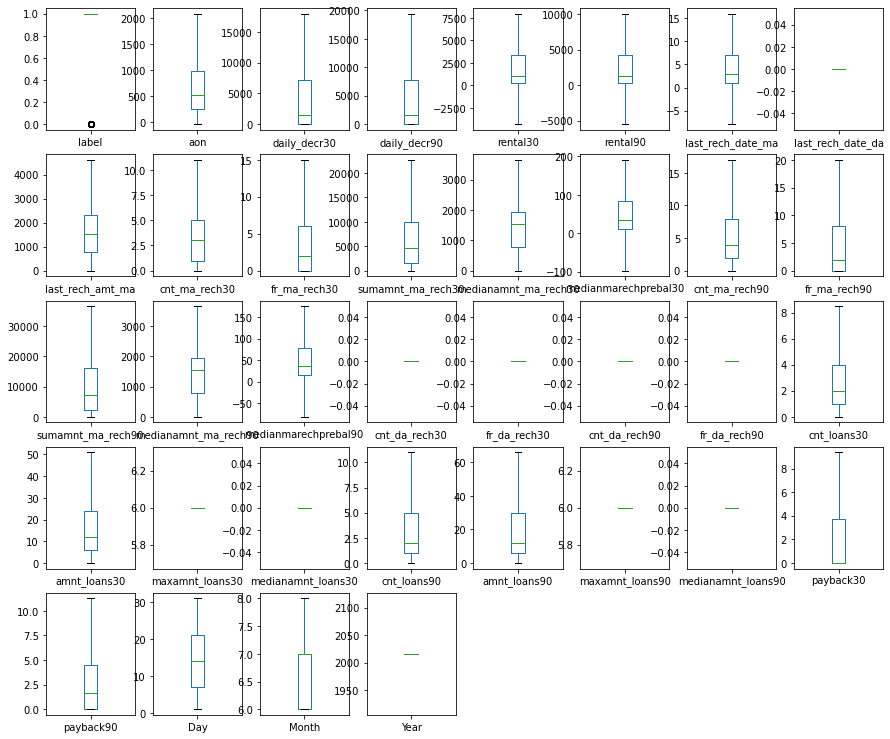

In [30]:
loan_new.plot(kind='box', subplots=True, layout=(5,8), figsize = (15,13))

We can see that we have successfully removed the outliers. 

-2.270253719912255
label Column is having skewness


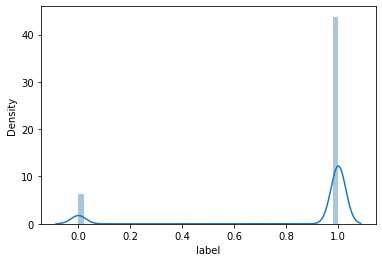

0.9471274387223189
aon Column is having skewness


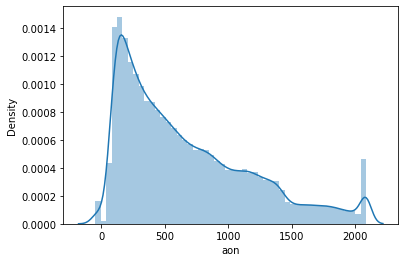

1.2392311647674779
daily_decr30 Column is having skewness


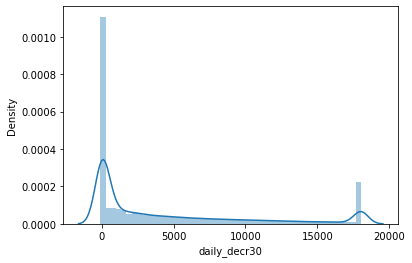

1.238994667661068
daily_decr90 Column is having skewness


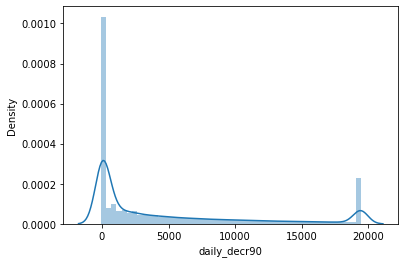

1.1925098502039468
rental30 Column is having skewness


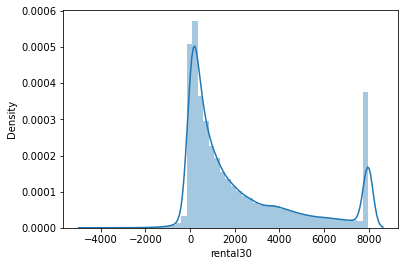

1.193291113119697
rental90 Column is having skewness


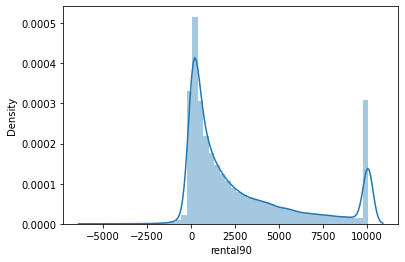

1.040300778034373
last_rech_date_ma Column is having skewness


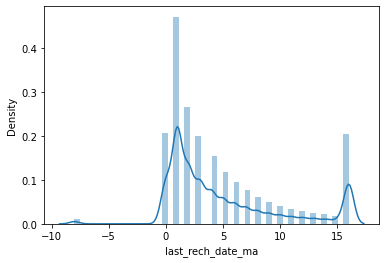

0
No skewness is present in last_rech_date_da


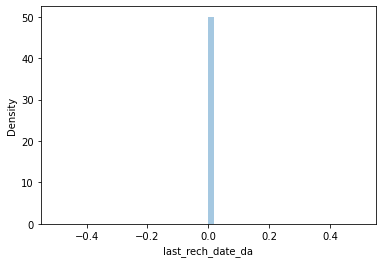

1.0034464262823297
last_rech_amt_ma Column is having skewness


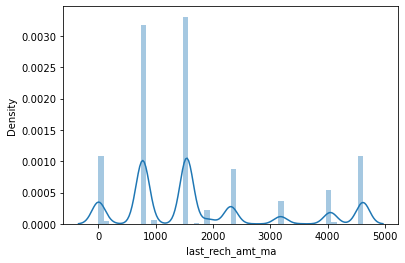

0.9041573118009442
cnt_ma_rech30 Column is having skewness


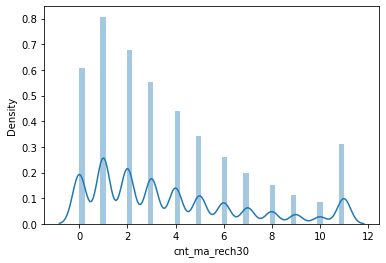

1.253282147454247
fr_ma_rech30 Column is having skewness


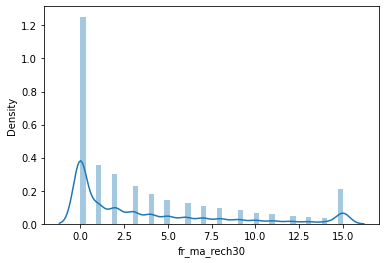

1.0807706400852082
sumamnt_ma_rech30 Column is having skewness


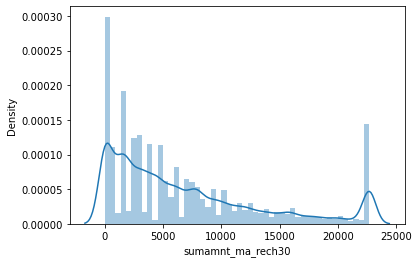

0.7282185308830263
medianamnt_ma_rech30 Column is having skewness


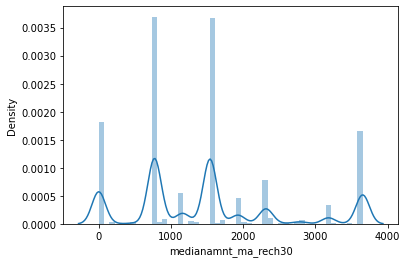

0.9886279675189577
medianmarechprebal30 Column is having skewness


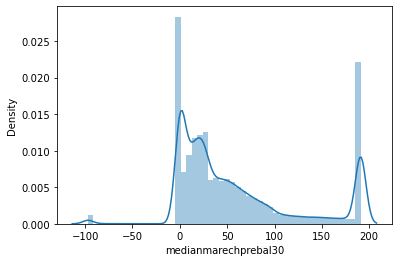

0.934789392328883
cnt_ma_rech90 Column is having skewness


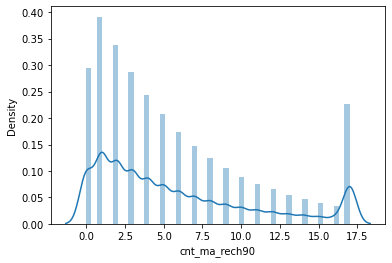

1.1724789520495675
fr_ma_rech90 Column is having skewness


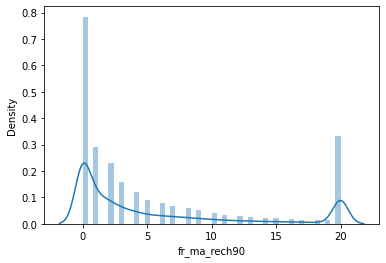

1.1264207157552313
sumamnt_ma_rech90 Column is having skewness


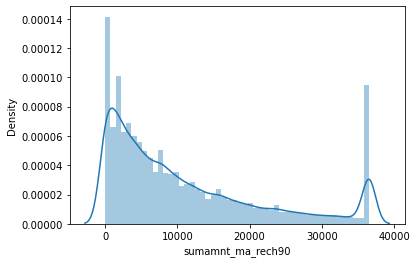

0.7639035559681836
medianamnt_ma_rech90 Column is having skewness


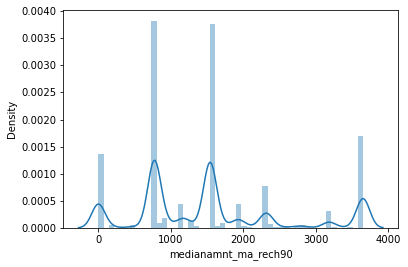

0.9579331134878262
medianmarechprebal90 Column is having skewness


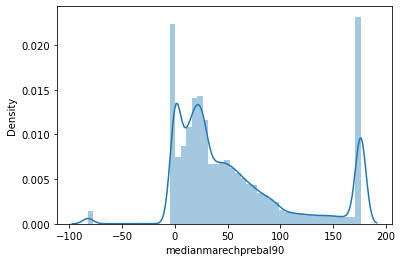

0
No skewness is present in cnt_da_rech30


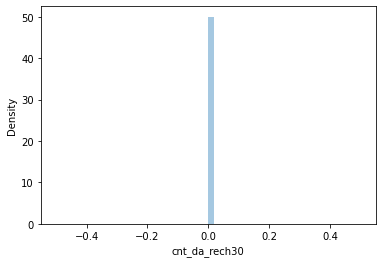

0
No skewness is present in fr_da_rech30


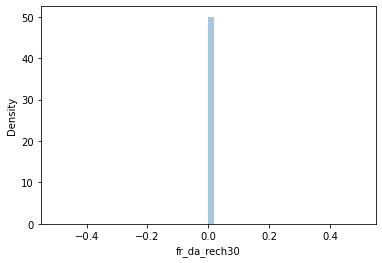

0
No skewness is present in cnt_da_rech90


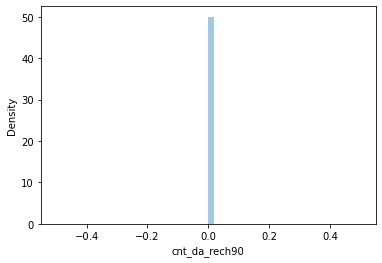

0
No skewness is present in fr_da_rech90


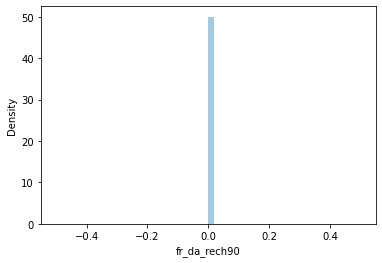

1.3403476579804627
cnt_loans30 Column is having skewness


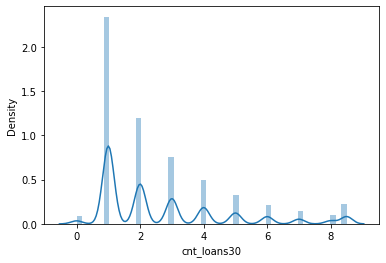

1.2310896346734153
amnt_loans30 Column is having skewness


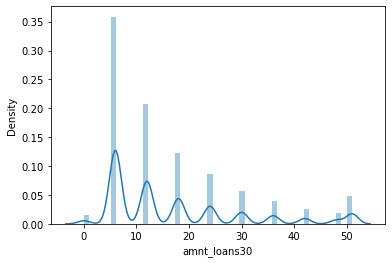

0
No skewness is present in maxamnt_loans30


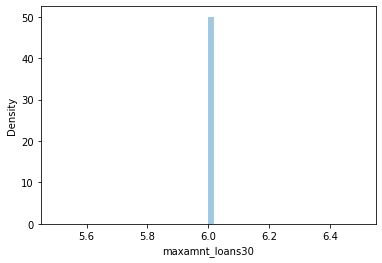

0
No skewness is present in medianamnt_loans30


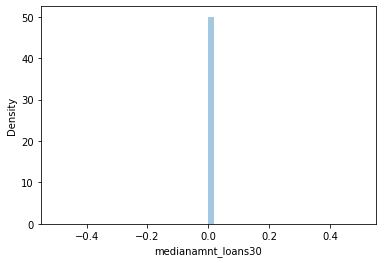

1.2818609603079028
cnt_loans90 Column is having skewness


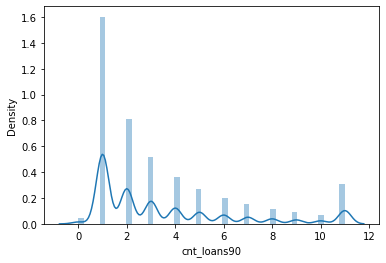

1.2179401913947883
amnt_loans90 Column is having skewness


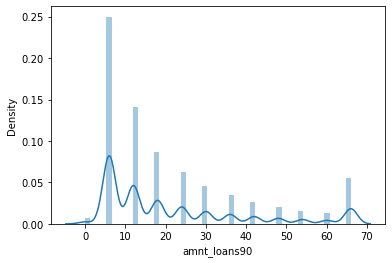

0
No skewness is present in maxamnt_loans90


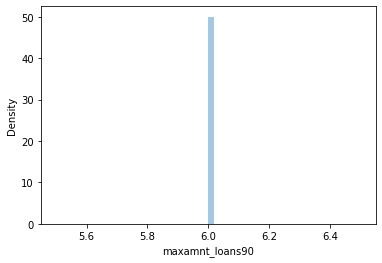

0
No skewness is present in medianamnt_loans90


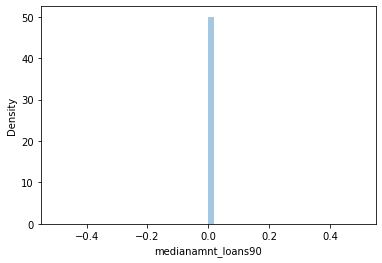

1.1893120356391396
payback30 Column is having skewness


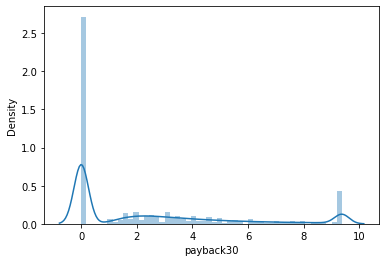

1.170814527217898
payback90 Column is having skewness


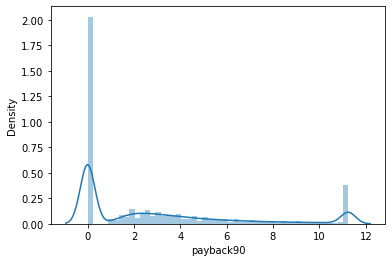

0.19984532530201307
No skewness is present in Day


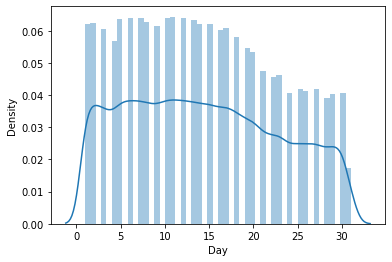

0.3432418941187077
No skewness is present in Month


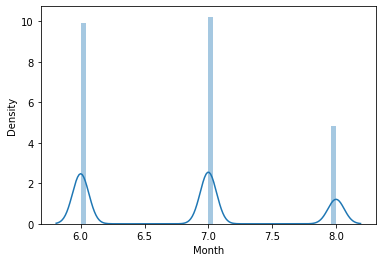

0
No skewness is present in Year


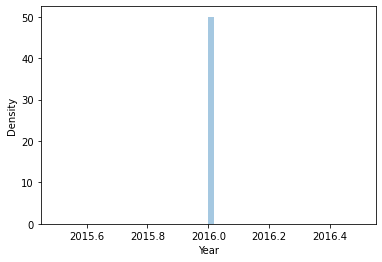

In [31]:
skew_col = []
for i in col:
    if loan_new[i].dtype == 'float64' or loan_new[i].dtype == 'int64':
        if (loan_new[i].skew() > 0.55 or loan_new[i].skew() < -0.55): 
            print(loan_new[i].skew())
            print(i,"Column is having skewness")
            skew_col.append(i)
        else:
            print(loan_new[i].skew())
            print("No skewness is present in",i)
        plt.figure()
        sns.distplot(loan_new[i])
        plt.show()
    else:
        print(i,"is Object datatype\n")

In [32]:
loan_new.corr()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,Day,Month,Year
label,1.000000,0.074837,0.209546,0.212596,0.075512,0.091473,-0.051773,NaN,0.180538,0.283997,0.157933,0.268710,0.208705,0.186195,0.291153,0.123740,0.272129,0.183003,0.179675,NaN,NaN,NaN,NaN,0.220750,0.230378,NaN,NaN,0.231642,0.242269,NaN,NaN,0.162453,0.158440,0.006825,0.154949,NaN
aon,0.074837,1.000000,0.073058,0.074483,0.062627,0.067639,0.046414,NaN,0.083005,0.005918,0.047177,0.055225,0.080583,0.033031,0.027110,0.050703,0.073892,0.085598,0.030671,NaN,NaN,NaN,NaN,0.038073,0.042763,NaN,NaN,0.068926,0.070789,NaN,NaN,0.026497,0.046460,0.010050,0.066131,NaN
daily_decr30,0.209546,0.073058,1.000000,0.988493,0.547591,0.594924,-0.027500,NaN,0.303884,0.475364,0.102160,0.593884,0.329389,0.156038,0.631720,-0.023808,0.734320,0.291768,0.118592,NaN,NaN,NaN,NaN,0.390578,0.476217,NaN,NaN,0.537957,0.598839,NaN,NaN,0.170069,0.203694,0.011570,0.645831,NaN
daily_decr90,0.212596,0.074483,0.988493,1.000000,0.543129,0.602604,-0.020450,NaN,0.295941,0.459243,0.105600,0.569691,0.319066,0.154170,0.637153,-0.022213,0.734576,0.285951,0.117862,NaN,NaN,NaN,NaN,0.371639,0.458009,NaN,NaN,0.538692,0.599540,NaN,NaN,0.167291,0.205417,-0.008518,0.672988,NaN
rental30,0.075512,0.062627,0.547591,0.543129,1.000000,0.961501,-0.022266,NaN,0.153719,0.316639,0.067657,0.354958,0.172734,0.069985,0.403608,-0.013724,0.424637,0.147041,0.043024,NaN,NaN,NaN,NaN,0.245503,0.297899,NaN,NaN,0.339128,0.377100,NaN,NaN,0.166802,0.199815,0.054005,0.438271,NaN
rental90,0.091473,0.067639,0.594924,0.602604,0.961501,1.000000,-0.004390,NaN,0.155660,0.314861,0.075480,0.348283,0.172005,0.072866,0.439442,-0.011183,0.456255,0.149295,0.045314,NaN,NaN,NaN,NaN,0.238512,0.298318,NaN,NaN,0.365505,0.407149,NaN,NaN,0.167338,0.215810,0.030473,0.518465,NaN
last_rech_date_ma,-0.051773,0.046414,-0.027500,-0.020450,-0.022266,-0.004390,1.000000,NaN,0.321102,-0.264115,-0.046618,-0.137059,0.173790,0.034106,-0.180917,0.120791,-0.060108,0.302706,0.115604,NaN,NaN,NaN,NaN,-0.235744,-0.226924,NaN,NaN,-0.184333,-0.182385,NaN,NaN,-0.170379,-0.090569,0.037225,0.074874,NaN
last_rech_date_da,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last_rech_amt_ma,0.180538,0.083005,0.303884,0.295941,0.153719,0.155660,0.321102,NaN,1.000000,0.064383,0.138644,0.501655,0.781842,0.228614,0.093060,0.180422,0.480419,0.823880,0.255553,NaN,NaN,NaN,NaN,0.023924,0.066099,NaN,NaN,0.049700,0.079626,NaN,NaN,-0.004714,0.025941,0.040837,0.122982,NaN
cnt_ma_rech30,0.283997,0.005918,0.475364,0.459243,0.316639,0.314861,-0.264115,NaN,0.064383,1.000000,0.020519,0.738921,0.100977,0.198947,0.895261,-0.139942,0.659689,0.031593,0.159181,NaN,NaN,NaN,NaN,0.761908,0.760289,NaN,NaN,0.698215,0.711218,NaN,NaN,0.263695,0.194503,0.083910,0.177802,NaN


<function matplotlib.pyplot.show(close=None, block=None)>

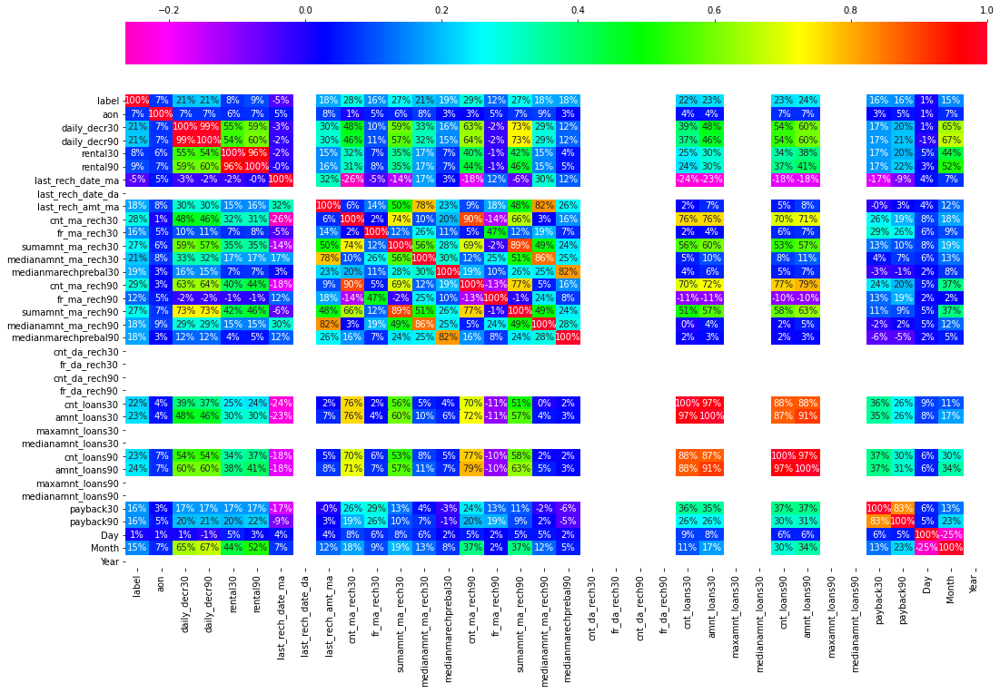

In [33]:
plt.figure(figsize=(17,12))
sns.heatmap(loan_new.corr(),annot=True, cmap = 'gist_rainbow_r',fmt='.0%',cbar_kws = dict(use_gridspec=False,location="top"))
plt.show

In [34]:
loan_new.corr()["label"].sort_values(ascending=False)

label                   1.000000
cnt_ma_rech90           0.291153
cnt_ma_rech30           0.283997
sumamnt_ma_rech90       0.272129
sumamnt_ma_rech30       0.268710
amnt_loans90            0.242269
cnt_loans90             0.231642
amnt_loans30            0.230378
cnt_loans30             0.220750
daily_decr90            0.212596
daily_decr30            0.209546
medianamnt_ma_rech30    0.208705
medianmarechprebal30    0.186195
medianamnt_ma_rech90    0.183003
last_rech_amt_ma        0.180538
medianmarechprebal90    0.179675
payback30               0.162453
payback90               0.158440
fr_ma_rech30            0.157933
Month                   0.154949
fr_ma_rech90            0.123740
rental90                0.091473
rental30                0.075512
aon                     0.074837
Day                     0.006825
last_rech_date_ma      -0.051773
last_rech_date_da            NaN
cnt_da_rech30                NaN
fr_da_rech30                 NaN
cnt_da_rech90                NaN
fr_da_rech

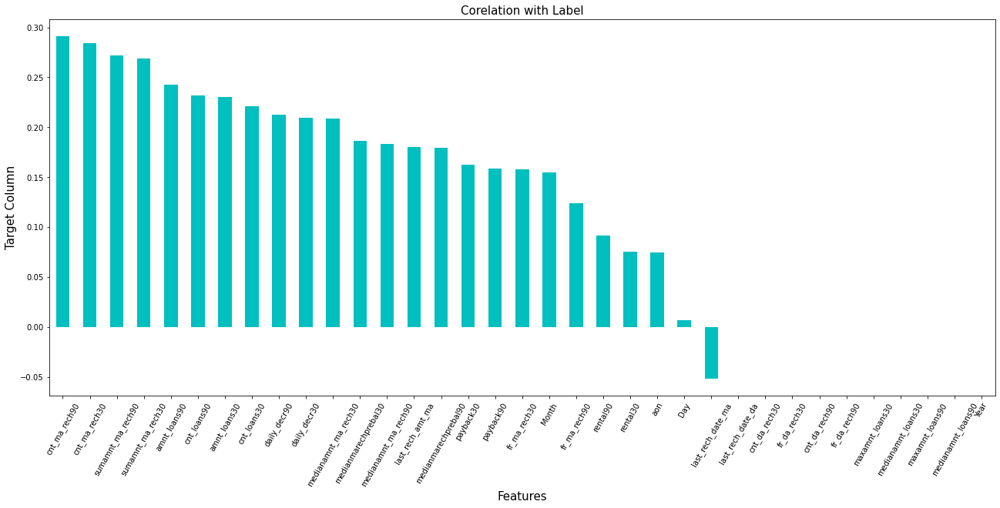

In [35]:
plt.figure(figsize=(22,9))
loan_new.corr()["label"].sort_values(ascending=False).drop(["label"]).plot(kind='bar',color='c')
plt.xticks(rotation=60)
plt.xlabel("Features",fontsize=15)
plt.ylabel("Target Column",fontsize=15)
plt.title('Corelation with Label',fontsize=15)
plt.show()

From the heatmap and above figure we can see that below mentioned columns are least corelated with the target. 

1. last_rech_date_ma
2. last_rech_date_da            
3. cnt_da_rech30                
4. fr_da_rech30                 
5. cnt_da_rech90                
6. fr_da_rech90                 
7. maxamnt_loans30              
8. medianamnt_loans30           
9. maxamnt_loans90              
10. medianamnt_loans90           
11. Year                  



In [36]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(x):
    vif = pd.DataFrame()
    vif["Variables"] = x.columns
    vif["VIF Factor"] = [variance_inflation_factor(x.values,i) for i in range(x.shape[1]) ]
    return (vif)

In [37]:
calc_vif(loan_new)

,Variables,VIF Factor
0,label,1.203637
1,aon,1.025838
2,daily_decr30,54.232108
3,daily_decr90,59.853024
4,rental30,15.630400
5,rental90,17.603801
6,last_rech_date_ma,1.427743
7,last_rech_date_da,NaN
8,last_rech_amt_ma,3.729988
9,cnt_ma_rech30,15.527433


In [38]:
loan_new.head(5)

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,Day,Month,Year
0,0,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539.0,2.0,15.0,3078.0,1539.0,7.50,2.0,20.0,3078.0,1539.0,7.50,0.0,0.0,0.0,0.0,2.0,12.0,6.0,0.0,2.0,12.0,6.0,0.0,9.375000,11.250000,20,7,2016
1,1,712.0,12122.000000,12124.750000,3691.26,3691.26,16.0,0.0,4617.5,1.0,0.0,5787.0,3655.0,61.04,1.0,0.0,5787.0,3650.5,61.04,0.0,0.0,0.0,0.0,1.0,12.0,6.0,0.0,1.0,12.0,6.0,0.0,0.000000,0.000000,10,8,2016
2,1,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539.0,1.0,0.0,1539.0,1539.0,66.32,1.0,0.0,1539.0,1539.0,66.32,0.0,0.0,0.0,0.0,1.0,6.0,6.0,0.0,1.0,6.0,6.0,0.0,0.000000,0.000000,19,8,2016
3,1,241.0,21.228000,21.228000,159.42,159.42,16.0,0.0,947.0,0.0,0.0,0.0,0.0,0.00,1.0,0.0,947.0,947.0,2.50,0.0,0.0,0.0,0.0,2.0,12.0,6.0,0.0,2.0,12.0,6.0,0.0,0.000000,0.000000,6,6,2016
4,1,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309.0,7.0,2.0,20029.0,2309.0,29.00,8.0,2.0,23496.0,2888.0,35.00,0.0,0.0,0.0,0.0,7.0,42.0,6.0,0.0,7.0,42.0,6.0,0.0,2.333333,2.333333,22,6,2016


In [39]:
loan_new.shape

(209593, 36)

In [40]:
wine

NameError: name 'wine' is not defined

In [41]:
x = loan_new.iloc[:,1:36]
x.head()

,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,Day,Month,Year
0,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539.0,2.0,15.0,3078.0,1539.0,7.50,2.0,20.0,3078.0,1539.0,7.50,0.0,0.0,0.0,0.0,2.0,12.0,6.0,0.0,2.0,12.0,6.0,0.0,9.375000,11.250000,20,7,2016
1,712.0,12122.000000,12124.750000,3691.26,3691.26,16.0,0.0,4617.5,1.0,0.0,5787.0,3655.0,61.04,1.0,0.0,5787.0,3650.5,61.04,0.0,0.0,0.0,0.0,1.0,12.0,6.0,0.0,1.0,12.0,6.0,0.0,0.000000,0.000000,10,8,2016
2,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539.0,1.0,0.0,1539.0,1539.0,66.32,1.0,0.0,1539.0,1539.0,66.32,0.0,0.0,0.0,0.0,1.0,6.0,6.0,0.0,1.0,6.0,6.0,0.0,0.000000,0.000000,19,8,2016
3,241.0,21.228000,21.228000,159.42,159.42,16.0,0.0,947.0,0.0,0.0,0.0,0.0,0.00,1.0,0.0,947.0,947.0,2.50,0.0,0.0,0.0,0.0,2.0,12.0,6.0,0.0,2.0,12.0,6.0,0.0,0.000000,0.000000,6,6,2016
4,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309.0,7.0,2.0,20029.0,2309.0,29.00,8.0,2.0,23496.0,2888.0,35.00,0.0,0.0,0.0,0.0,7.0,42.0,6.0,0.0,7.0,42.0,6.0,0.0,2.333333,2.333333,22,6,2016


In [42]:
y = loan_new['label']
y.head()

0    0
1    1
2    1
3    1
4    1
Name: label, dtype: int64

In [43]:
loan_new.shape

(209593, 36)

In [44]:
from sklearn.preprocessing import power_transform
x = power_transform(x,method='yeo-johnson')

In [45]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()
x,y = smote.fit_resample(x,y)

<AxesSubplot:xlabel='label', ylabel='count'>

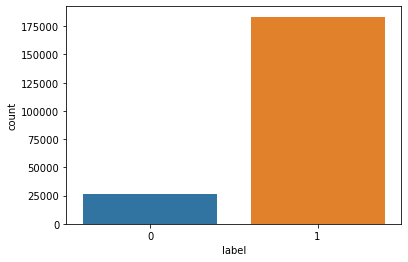

In [46]:
sns.countplot(loan_new['label'])

<AxesSubplot:xlabel='label', ylabel='count'>

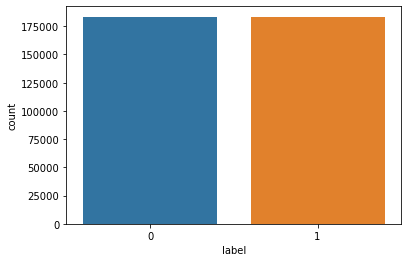

In [47]:
sns.countplot(y)

In [48]:
from sklearn.preprocessing import MinMaxScaler
mc = MinMaxScaler()
x = mc.fit_transform(x)

In [49]:
from sklearn.model_selection import train_test_split

In [50]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

In [51]:
log = LogisticRegression()
nv = GaussianNB()
support = SVC()
knear = KNeighborsClassifier()
dec_tree = DecisionTreeClassifier()

In [52]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.30, random_state = 45)

In [53]:
log.fit(x_train,y_train)
prediction = log.predict(x_test)
print("The accuracy score is:-",accuracy_score(y_test,prediction)*100,'\n')
cm = confusion_matrix(y_test,prediction)
print("The confusion matrix is :- \n",cm,'\n')    
print("The classification report is:- \n",classification_report(y_test,prediction),'\n')

The accuracy score is:- 77.32761518821722 

The confusion matrix is :- 
 [[43273 11816]
 [13137 41833]] 

The classification report is:- 
               precision    recall  f1-score   support

           0       0.77      0.79      0.78     55089
           1       0.78      0.76      0.77     54970

    accuracy                           0.77    110059
   macro avg       0.77      0.77      0.77    110059
weighted avg       0.77      0.77      0.77    110059
 



In [56]:
dec_tree.fit(x_train,y_train)
prediction_dec = dec_tree.predict(x_test)
dtc_accu = accuracy_score(y_test,prediction_dec)
print("The accuracy score is:-",dtc_accu*100,'\n')
cm = confusion_matrix(y_test,prediction_dec)
print("The confusion matrix is :- \n",cm,'\n')    
print("The classification report is:- \n",classification_report(y_test,prediction_dec),'\n')

The accuracy score is:- 91.51455128612835 

The confusion matrix is :- 
 [[50839  4250]
 [ 5089 49881]] 

The classification report is:- 
               precision    recall  f1-score   support

           0       0.91      0.92      0.92     55089
           1       0.92      0.91      0.91     54970

    accuracy                           0.92    110059
   macro avg       0.92      0.92      0.92    110059
weighted avg       0.92      0.92      0.92    110059
 



In [57]:
from sklearn.model_selection import cross_val_score
cv_score = cross_val_score(dec_tree,x,y,cv=5)
print('\n')
print("Cross Validation Score is:- \n",cv_score)
print("Mean of Cross Validation Score is:- \n",cv_score.mean())
print("Standard Deviation of Cross Validation Score is:- \n",cv_score.std())
print('\n')



Cross Validation Score is:- 
 [0.83987298 0.92776634 0.92906013 0.93073652 0.92811972]
Mean of Cross Validation Score is:- 
 0.9111111387468724
Standard Deviation of Cross Validation Score is:- 
 0.03563393108514902




In [68]:
print('Model Score',accuracy_score(y_test,prediction_dec)*100)
print('Mean Score After CV',cv_score.mean())
print("Model Score is", dtc_accu-cv_score.mean())
print('\n')

Model Score 91.51455128612835
Mean Score After CV 0.9111111387468724
Model Score is -0.0329912212480763




In [69]:
from sklearn.model_selection import RandomizedSearchCV

In [70]:
criterion = ['gini','entropy']
splitter = ['random','best']
max_depth = [int(x) for x in np.linspace(5,30,num=6)]
min_samples_split = [5,10,15,20,100]
min_samples_leaf = [2,5,10,15]
ccp_alpha = [0.5,1.5,2.5,3.5,4.5,5.5]
max_features = [2,4,6,8,10]
max_features = ['auto','sqrt','log2']

random_grid = {
    'criterion':criterion,
    'max_features':max_features,
    'max_features':max_features,
    'splitter':splitter,
    'max_depth':max_depth,
    'min_samples_split':min_samples_split,
    'min_samples_leaf':min_samples_leaf
}

In [71]:
rf_random = RandomizedSearchCV(estimator=dec_tree,param_distributions=random_grid,scoring='neg_mean_squared_error',n_iter=10,cv=5,verbose=2,n_jobs=1)

In [72]:
rf_random.fit(x_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random; total time=   0.3s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random; total time=   0.3s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random; total time=   0.3s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random; total time=   0.3s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random; total time=   0.3s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=5, min_samples_split=20, splitter=random; total time=   0.2s
[CV] END criterion=gini, max_depth=15, max_features=log2, min_samples_leaf=5, min_samples_split=20, splitter=random; total time=

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [5, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [2, 5, 10, 15],
                                        'min_samples_split': [5, 10, 15, 20,
                                                              100],
                                        'splitter': ['random', 'best']},
                   scoring='neg_mean_squared_error', verbose=2)

In [73]:
rf_random.best_params_

{'splitter': 'best',
 'min_samples_split': 10,
 'min_samples_leaf': 15,
 'max_features': 'sqrt',
 'max_depth': 20,
 'criterion': 'entropy'}

class sklearn.tree.DecisionTreeClassifier(*, criterion='gini', splitter='best', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, class_weight=None, ccp_alpha=0.0)

In [64]:
from sklearn.tree import DecisionTreeClassifier

In [74]:
dec_tree_para = DecisionTreeClassifier(criterion='entropy',splitter='best',min_samples_split=10,min_samples_leaf=15,max_features='sqrt',max_depth=20)

In [75]:
dec_tree_para.fit(x_train,y_train)
prediction_para = dec_tree_para.predict(x_test)
dtc_accu = accuracy_score(y_test,prediction_para)
print("The accuracy score is:-",dtc_accu*100,'\n')
cm = confusion_matrix(y_test,prediction_para)
print("The confusion matrix is :- \n",cm,'\n')    
print("The classification report is:- \n",classification_report(y_test,prediction_para),'\n')

The accuracy score is:- 86.84978057223852 

The confusion matrix is :- 
 [[49143  5946]
 [ 8527 46443]] 

The classification report is:- 
               precision    recall  f1-score   support

           0       0.85      0.89      0.87     55089
           1       0.89      0.84      0.87     54970

    accuracy                           0.87    110059
   macro avg       0.87      0.87      0.87    110059
weighted avg       0.87      0.87      0.87    110059
 



In [76]:
import pickle

In [77]:
load_model = pickle.load(open('micor_credit_model.pkl','rb'))
result = load_model.score(x_test,y_test)
print(result)

0.9099846445997147


In [78]:
conclusion = pd.DataFrame([load_model.predict(x_test)[:],prediction_dec[:]],index=['Predicted','Original'])
conclusion

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021